# Grupo - Gustavo Barroso  & Henrique  Mayor

In [106]:
import pickle
import pathlib

import numpy as np
import pandas as pd

### Justification for No Further Strong Feature Engineering

Your comprehensive feature engineering process has effectively prepared the dataset for modeling by addressing key aspects essential for building a robust predictive model. Here's why no additional feature engineering is necessary at this stage:

1. **Data Quality and Integrity:** By removing outliers and eliminating rows with missing values, you've ensured that the dataset is clean and free from anomalies that could distort model training. This enhances the reliability of the predictions.

2. **Balanced and Relevant Features:** Merging classes to balance categorical variables, such as consolidating `Sale.Type` categories into `GroupedWD` and `Other`, prevents class imbalance issues. This ensures that the model learns uniformly from all classes without being biased toward more frequent categories.

3. **Reduction of Redundancy:** Dropping near-constant and irrelevant features, like the `Street` column, reduces noise and dimensionality. This simplification helps in focusing the model on the most impactful variables, improving both efficiency and performance.

4. **Meaningful Transformations:** Transforming the `SalePrice` using a log transformation normalizes its distribution, facilitating better model performance. Additionally, converting year-based variables to age-related features provides a more intuitive and meaningful representation of temporal data, enhancing the model's ability to capture relevant patterns.

5. **Streamlined Feature Set:** By removing redundant quality indicators and merging similar ordinal classes, you've streamlined the feature set. This ensures that each feature contributes unique and valuable information to the model, avoiding multicollinearity and improving interpretability.

6. **Enhanced Feature Representation:** Handling different types of variables appropriately—whether continuous, discrete, ordinal, or categorical—ensures that each feature is represented in a way that maximizes its predictive power. This tailored approach allows the model to effectively utilize the inherent structure of the data.

### **Conclusion**

The only remaining step before proceeding to modeling left is to:

**Encoding Ordinal Variables**:

- Purpose: Transformed ordinal columns into integer codes using pd.factorize to maintain the inherent order for modeling.

**One-Hot Encoding Nominal Variables**:

- Purpose: Applied one-hot encoding to nominal categorical columns with pd.get_dummies, using drop_first=True to avoid multicollinearity.

In [ ]:
DATA_DIR = pathlib.Path.cwd() / 'data'
clean_data_path = DATA_DIR / 'processed' / 'ames_clean.pkl'

with open(clean_data_path, 'rb') as file:
    data = pickle.load(file)

model_data = data.copy()

categorical_columns = []
ordinal_columns = []

for col in model_data.select_dtypes('category').columns:
    if model_data[col].cat.ordered:
        ordinal_columns.append(col)
    else:
        categorical_columns.append(col)


for col in ordinal_columns:
    codes, _ = pd.factorize(data[col], sort=True)
    model_data[col] = codes

model_data = pd.get_dummies(model_data, drop_first=True)
model_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2877 entries, 0 to 2929
Columns: 165 entries, Lot.Frontage to Exterior_Other
dtypes: bool(119), float64(34), int64(12)
memory usage: 1.4 MB


## Separação treino e teste

In [108]:
from sklearn.model_selection import train_test_split

# Separa os dados em features (X) e target (y)
X = model_data.drop(columns=['SalePrice']).copy()
y = model_data['SalePrice'].copy()

# Divide os dados em conjuntos de treino e teste
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2, # 20% dos dados para teste
    random_state=42
)

# Models to be tested:

- Linear Regression (Baseline)
- Ridge Regression (Linear Model)
- Random Forest (Ensemble)
- LightGBM (Gradient Boosting)
- XGBoost (Gradient Boosting)

In [109]:
from sklearn.metrics import mean_squared_error

def print_errors(y_true, y_pred):
    """
    Shows RMSE and error percentage for a model's predictions.
    """
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    error_percent = 100 * (10 ** rmse -1)

    print(f'RMSE: {rmse:.4f}')
    print(f'Average error: {error_percent:.2f}%')

## Linear Regression

- Simple model that could be used as a baseline

In [110]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()

# Training the model
model.fit(X_train, y_train)

# Predicting the target on the training set
y_pred = model.predict(X_test)

print_errors(y_test, y_pred)

RMSE: 0.0583
Average error: 14.37%


## Ridge Regression

- Um modelo linear que usa regularização L2 para evitar overfitting (penaliza os coeficientes muito grandes)

In [111]:
from sklearn.linear_model import RidgeCV

# Ridge regression model with cross-validation to find the best alpha
model = RidgeCV(
    alphas=[0.1, 1.0, 10.0, 100.0],
    store_cv_values=True
)

# Training the model
model.fit(X_train, y_train)

# Predicting the target on the training set
y_pred = model.predict(X_test)


print(f'Best alpha is {model.alpha_}')
print_errors(y_test, y_pred)

Best alpha is 10.0
RMSE: 0.0591
Average error: 14.58%


/Users/gubscruz/Downloads/INSPER/4_PERIODO/machine-learning/ames-aps/ames-machine-learning/tf-env/lib/python3.10/site-packages/sklearn/linear_model/_ridge.py:2341: FutureWarning: 'store_cv_values' is deprecated in version 1.5 and will be removed in 1.7. Use 'store_cv_results' instead.
  warnings.warn(


## Random Forest

- Ensemble model that uses multiple decision trees to make predictions
- Can handle non-linear relationships and interactions between features
- Can handle missing values and outliers

In [112]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the RandomForestRegressor model
rf_model = RandomForestRegressor(random_state=42)

# Define the grid of hyperparameters to search
param_grid = {
    'n_estimators': [100, 200, 300],      # Number of trees in the forest
    'max_depth': [10, 20],          # Maximum depth of each tree
    'min_samples_split': [2, 5],      # Minimum number of samples to split an internal node
    'min_samples_leaf': [2, 4],        # Minimum number of samples required to be at a leaf node
    'bootstrap': [True]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=5, # 5-fold cross-validation
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_rf_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_rf_model.predict(X_test)

# Print results
print(f"Best Hyperparameters: {grid_search.best_params_}")
print_errors(y_test, y_pred)

Best Hyperparameters: {'bootstrap': True, 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
RMSE: 0.0566
Average error: 13.92%


#### Most important features for Random Forest

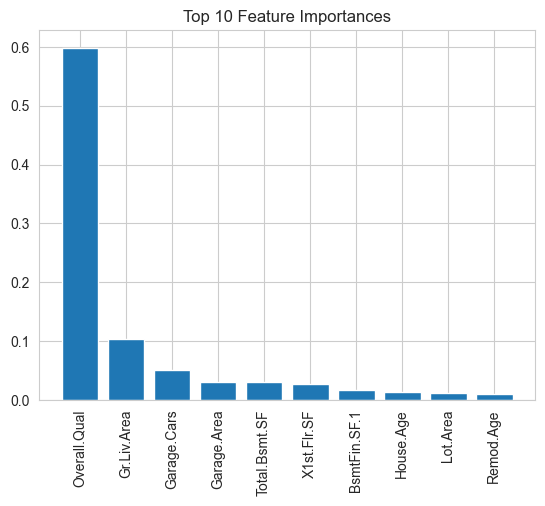

In [113]:
import matplotlib.pyplot as plt

# Get the feature importances and sort them
feature_importances = best_rf_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]

top_n = 10
top_indices = sorted_indices[:top_n]

# Plot the top 10 features
plt.bar(range(top_n), feature_importances[top_indices])
plt.xticks(range(top_n), X_train.columns[top_indices], rotation=90)
plt.title("Top 10 Feature Importances")
plt.show()


## LightGBM

- Gradient boosting model that uses decision trees
- Fast training speed and high efficiency

In [114]:
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV

lgb_model = lgb.LGBMRegressor(random_state=42)

# Hyperparameter grid
param_grid = {
    'n_estimators': [300, 400, 500],
    'max_depth': [2, 3, 5],
    'learning_rate': [0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.7, 0.8]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(
    estimator=lgb_model,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_model_lGBM = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_model_lGBM.predict(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise

In [115]:
print(f"Best Hyperparameters: {grid_search.best_params_}")
print_errors(y_test, y_pred)

Best Hyperparameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'subsample': 0.8}
RMSE: 0.0480
Average error: 11.68%


### Most important features for LightGBM

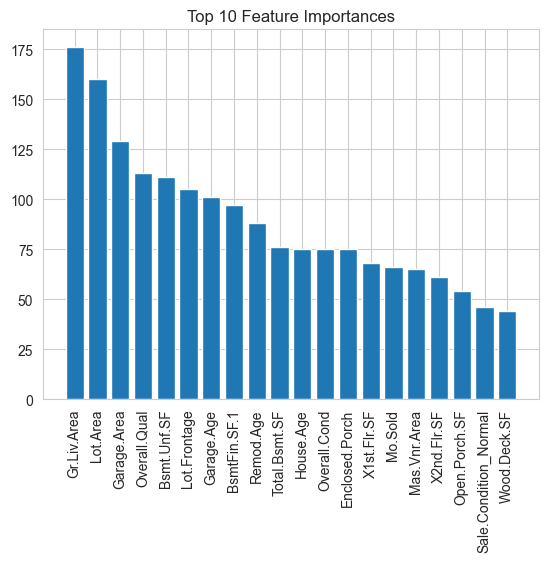

In [116]:
feature_importances = best_model_lGBM.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]

top_n = 20
top_indices = sorted_indices[:top_n]

# Plot the top 10 features
plt.bar(range(top_n), feature_importances[top_indices])
plt.xticks(range(top_n), X_train.columns[top_indices], rotation=90)
plt.title("Top 10 Feature Importances")
plt.show()

## XGBoost

- Very popular gradient boosting model
- Won many Kaggle competitions
- Good for structured/tabular data

In [117]:
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np

# Define the XGBoost model
xgb_model = XGBRegressor(random_state=42)

# Define the grid of hyperparameters to search
param_grid = {
    'n_estimators': [500, 600, 700],   # Number of boosting rounds
    'max_depth': [3, 5, 7],            # Maximum depth of the trees
    'learning_rate': [0.05, 0.1, 0.2], # Step size shrinkage
    'subsample': [0.8, 1.0],           # Fraction of samples used for training each tree
    'colsample_bytree': [0.8, 1.0]     # Fraction of features used for training each tree
}

# Set up the GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best model from the grid search
best_xgb_model = grid_search.best_estimator_

# Make predictions on the test set
y_pred = best_xgb_model.predict(X_test)

In [118]:
print(f"Best Hyperparameters: {grid_search.best_params_}")
print_errors(y_test, y_pred)

Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 600, 'subsample': 0.8}
RMSE: 0.0456
Average error: 11.08%


### Most important features for XGBoost

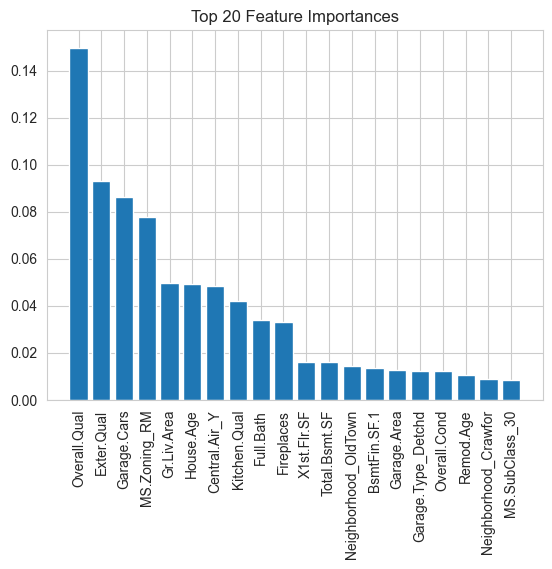

In [119]:
feature_importances = best_xgb_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]

top_n = 20
top_indices = sorted_indices[:top_n]

# Plot the top 10 features
plt.bar(range(top_n), feature_importances[top_indices])
plt.xticks(range(top_n), X_train.columns[top_indices], rotation=90)
plt.title("Top 20 Feature Importances")
plt.show()

# Comparing the models

In [ ]:
models = ['Linear Regression', 'Ridge', 'Random Forest', 'LightGBM', 'XGBoost']
rmse_values = [0.0583, 0.0591, 0.0566, 0.0480, 0.0456]
error_percentages = [14.37, 14.58, 13.92, 11.68, 11.08]

results = pd.DataFrame({
    'Model': models,
    'RMSE': rmse_values,
    'Error (%)': error_percentages
})

## RMSE of the models

/var/folders/pm/ps47mfm943x_nqjshcjsk5ch0000gn/T/ipykernel_7039/3288157977.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=results , x='RMSE', y='Model', palette='viridis')


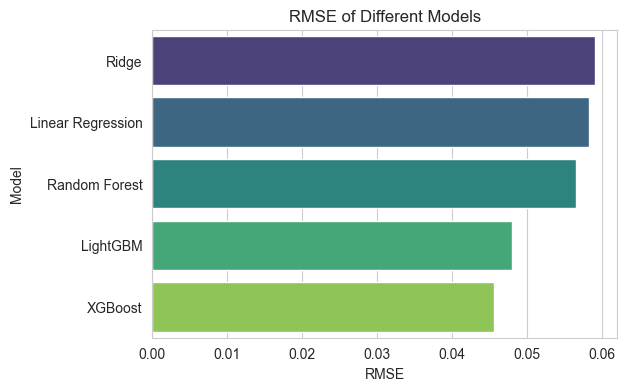

In [121]:
import seaborn as sns

# sort the results by RMSE
results = results.sort_values('RMSE', ascending=False)

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a bar plot of the RMSE values
plt.figure(figsize=(6, 4))
sns.barplot(data=results , x='RMSE', y='Model', palette='viridis')
plt.title('RMSE of Different Models')
plt.show()


## Percentage error of the models

/var/folders/pm/ps47mfm943x_nqjshcjsk5ch0000gn/T/ipykernel_7039/2460063274.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=results , x='Error (%)', y='Model', palette='viridis')


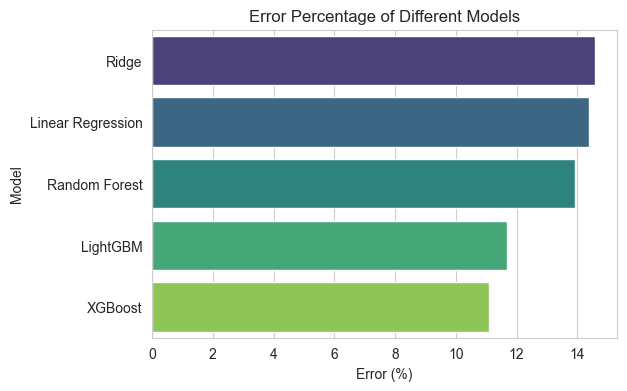

In [122]:
plt.figure(figsize=(6, 4))
sns.barplot(data=results , x='Error (%)', y='Model', palette='viridis')
plt.title('Error Percentage of Different Models')
plt.show()

# **Deciding the best model**

Since the RMSE of the models are being measured in log-transformed space, our primary metric for comparing the models will be the Percentage Error, as it reflects how well the model performs on the original scale of house prices, therefor providing a more intuitive understanding of the model's performance.

We observed that the **XGBoost model had the lowest percentage error, of 11.08%**, with a difference of 0.6% from the second best model, the LightGBM. 

The superior performance of the XGBoost was expected, as it known to offer [state of the art for housing price prediction](https://arxiv.org/abs/2402.04082). The improvemed accuracy of the model justifies its higher complexity.

### **Conclusion - XGBoost is the best model**

## **Feature Importance**

- **The most important features for the XGBoost model were:** `Overall_Qual`, `Exter_Qual`, `Garage_Cars`, `MS.Zoning_RM`, and `Gr_Liv_Area`.

- **It is interesting to note that the importance given to each feature changed significantly from the Random Forest model to the LightGBM and XGBoost models.**

---

#### **1. Comparative Analysis of Feature Importance Across Models**

While the XGBoost model identified `Overall_Qual`, `Exter_Qual`, `Garage_Cars`, `MS.Zoning_RM`, and `Gr_Liv_Area` as the top predictors, the Random Forest and LightGBM models may have highlighted different features as most influential. This discrepancy can be attributed to the inherent differences in how these algorithms handle feature interactions and importance calculations.

**Implications:**
- The variation in feature importance across models underscores the importance of model selection and understanding the underlying mechanisms of each algorithm.
- It suggests that while certain features are consistently important (like `Overall_Qual` and `Gr_Liv_Area`), others may vary based on the model's architecture and learning process.

#### **1. Interpretation of Top Features**

- **Overall_Qual (Overall Quality):**
  - Represents the overall material and finish quality of the house.
  - Its high importance across models indicates that quality significantly influences property prices.

- **Exter_Qual (Exterior Quality):**
  - Measures the quality of the exterior materials.
  - Suggests that the exterior appearance and durability are key factors in valuation.

- **Garage_Cars (Number of Cars in Garage):**
  - Indicates the size and capacity of the garage.
  - Reflects the convenience and additional storage space, affecting property attractiveness.

- **MS.Zoning_RM (Residential Zoning Classification):**
  - Denotes the zoning classification for the property.
  - Influences property value based on permissible land use and neighborhood regulations.

- **Gr_Liv_Area (Above Grade Living Area):**
  - Measures the total living area above ground level.


#### **2. Understanding Model Behavior**

- **Model-Specific Insights:**
  - The difference in feature importance between models like Random Forest and XGBoost indicates that each model may capture different patterns within the data.
  
- **Robustness of Features:**
  - Features consistently ranked high across multiple models can be considered robust predictors, enhancing confidence in their significance.

- **Overfitting Risks:**
  - Models with very high feature importance on specific variables might overfit to those features, reducing generalizability. Ensuring proper cross-validation and regularization can mitigate this risk.

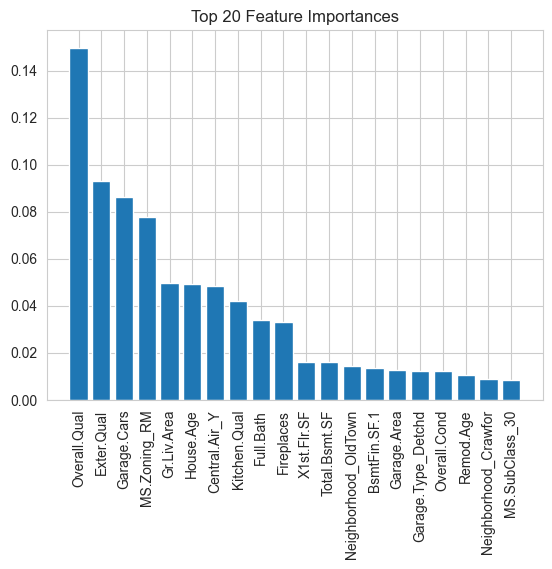

In [ ]:
feature_importances = best_xgb_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]

top_n = 20
top_indices = sorted_indices[:top_n]

# Plot the top 10 features
plt.bar(range(top_n), feature_importances[top_indices])
plt.xticks(range(top_n), X_train.columns[top_indices], rotation=90)
plt.title("Top 20 Feature Importances for XGBoost")
plt.show()

## **Consequeces of the model's performance for business applications**

An **11.08% error rate** in your regression model means that, on average, the model's predictions deviate from the actual values by about **11.08%**. For instance, for a housse valued at $200,000, this would translate to an error of approximately $22,160.

1. **Pricing Accuracy:**
   - **Real Estate:** If you're predicting property prices, an 11.08% error could lead to listings that are slightly above or below the market value. While this margin is relatively reasonable, it may affect competitiveness and buyer trust.
   
2. **Decision-Making:**
   - **Investment Decisions:** Investors relying on these predictions might face moderate risks. An 11% deviation could impact return on investment calculations and portfolio management.
   
3. **Customer Satisfaction:**
   - **Personalized Services:** In applications like personalized recommendations or pricing, this error rate might result in recommendations that are not perfectly aligned with customer expectations, potentially impacting user experience.
   

### **Conclusion**

An 11.08% error rate is generally acceptable for many business applications, offering a balance between complexity and performance. However, the acceptability largely depends on the specific context and the criticality of the predictions. The model can give a decent estimate of house prices, but for applications requiring higher precision, further optimization or model refinement may be necessary.

## **Retraining the Model with the complete dataset - for deploy**

In [124]:
import joblib

# Train the best XGBoost model on the full dataset
best_xgb_model.fit(X, y)

# Save the trained model
joblib.dump(best_xgb_model, 'trained_model.pkl')

['trained_model.pkl']